In [24]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

In [ ]:
dataDir = "PlantVillage"
selectedClasses = ['Pepper__bell___Bacterial_spot',
                   'Pepper__bell___healthy',
                   'Potato___Early_blight',
                   'Potato___Late_blight',
                   'Tomato_Early_blight',
                   'Tomato_Leaf_Mold'] 

In [26]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            

df

,imgPath,label
0,E:\PlantVillage\Tomato_Early_blight\fbb02290-8...,Tomato_Early_blight
1,E:\PlantVillage\Tomato_Leaf_Mold\50a47a28-bbe5...,Tomato_Leaf_Mold
2,E:\PlantVillage\Tomato_Leaf_Mold\4b6a59ef-a004...,Tomato_Leaf_Mold
3,E:\PlantVillage\Pepper__bell___Bacterial_spot\...,Pepper__bell___Bacterial_spot
4,E:\PlantVillage\Potato___Early_blight\df7e4d39...,Potato___Early_blight
...,...,...
6422,E:\PlantVillage\Pepper__bell___healthy\681d3cc...,Pepper__bell___healthy
6423,E:\PlantVillage\Tomato_Leaf_Mold\12319ec3-c990...,Tomato_Leaf_Mold
6424,E:\PlantVillage\Pepper__bell___Bacterial_spot\...,Pepper__bell___Bacterial_spot
6425,E:\PlantVillage\Tomato_Early_blight\2e7b090e-4...,Tomato_Early_blight


In [27]:
len(df)

6427

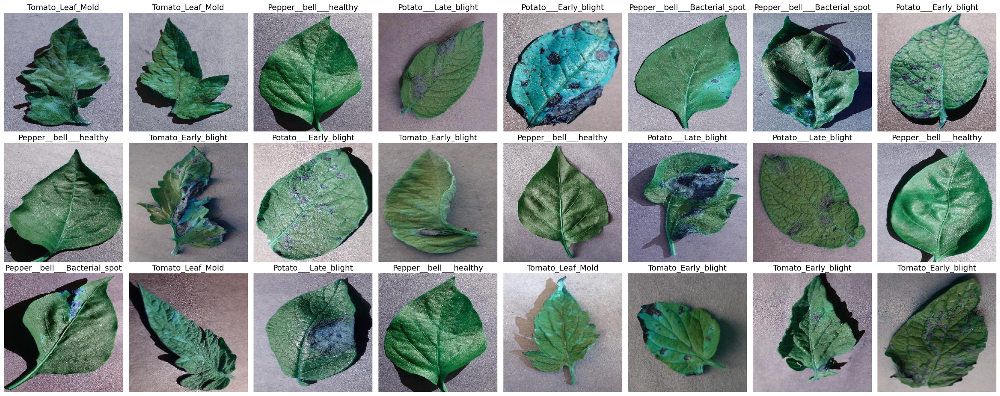

In [28]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

In [29]:
df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,
                                   'Pepper__bell___healthy':1 ,
                                   'Potato___Early_blight':2 ,
                                   'Potato___Late_blight':3 ,
                                   'Tomato_Early_blight':4 ,
                                   'Tomato_Leaf_Mold':5}).astype(int)

C:\Users\ma240\AppData\Local\Temp\ipykernel_13800\300140912.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,


In [30]:
IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 6427/6427 [00:04<00:00, 1601.48it/s]


In [31]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(6427, 6427)

In [32]:
images = images / 255.0         # normalize from 0 --> 255 to 0 --> 1  to reduce the execution time 

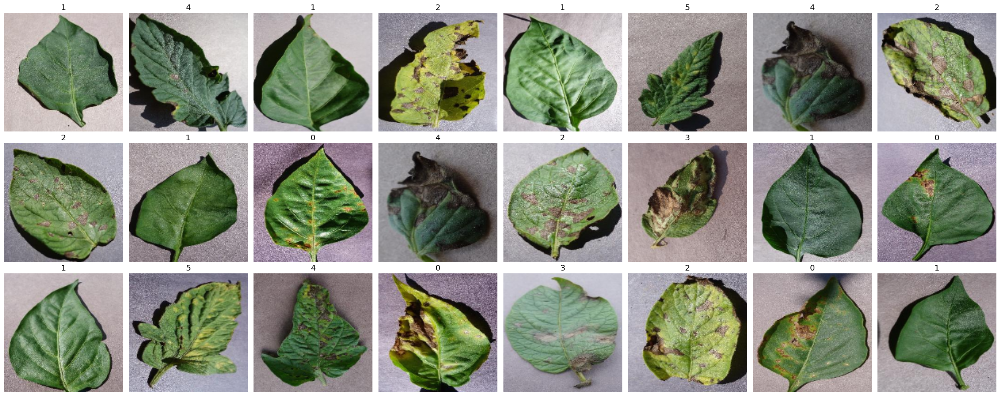

In [33]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()

In [34]:
# Spliting 

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (5141, 150, 150, 3)
Shape of X_test : (1286, 150, 150, 3)
Shape of y_train : (5141,)
Shape of y_test : (1286,)


CNN

In [35]:
with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

c:\Users\ma240\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [36]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [37]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=50,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 42s 467ms/step - accuracy: 0.5746 - loss: 1.1820 - val_accuracy: 0.1477 - val_loss: 5.6402
Epoch 2/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 45s 540ms/step - accuracy: 0.7934 - loss: 0.6091 - val_accuracy: 0.1477 - val_loss: 9.1730
Epoch 3/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 41s 492ms/step - accuracy: 0.8560 - loss: 0.4149 - val_accuracy: 0.1477 - val_loss: 10.2582
Epoch 4/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 27s 328ms/step - accuracy: 0.8573 - loss: 0.4090 - val_accuracy: 0.1477 - val_loss: 9.5646
Epoch 5/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 29s 344ms/step - accuracy: 0.8838 - loss: 0.3172 - val_accuracy: 0.1613 - val_loss: 5.6869
Epoch 6/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 35s 427ms/step - accuracy: 0.9105 - loss: 0.2754 - val_accuracy: 0.2381 - val_loss: 3.2810
Epoch 7/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 53s 635ms/step - accuracy: 0.9277 - loss: 0.2090 - val_accuracy: 0.3333 - val_loss: 2.7379
Epoch 8/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - accuracy: 0.9210 - loss: 0.2237 - val_acc

In [38]:
y_pred = kerasModel.predict(X_test)

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step


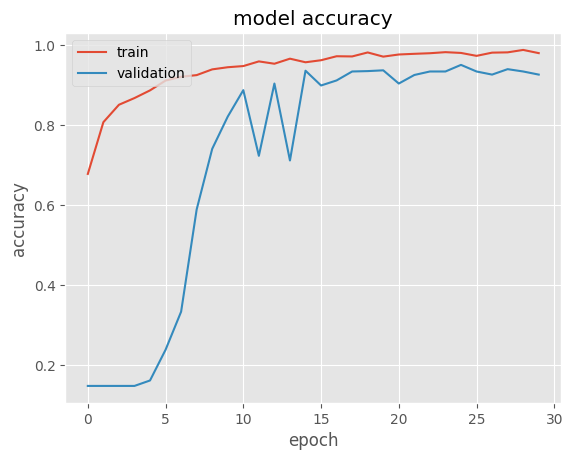

In [39]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [40]:
y_test[:10]

array([5, 0, 1, 2, 5, 1, 1, 0, 1, 5])

In [41]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[np.int64(5),
 np.int64(0),
 np.int64(1),
 np.int64(2),
 np.int64(5),
 np.int64(1),
 np.int64(1),
 np.int64(0),
 np.int64(1),
 np.int64(5)]

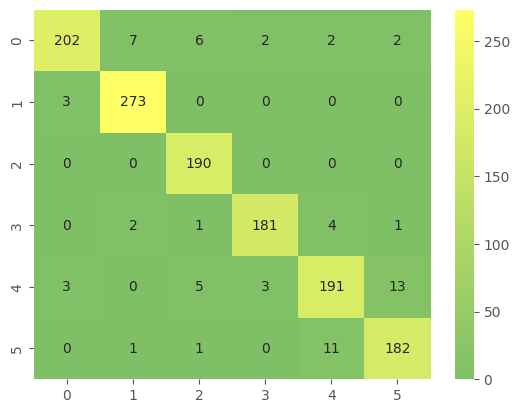

In [42]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [43]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.97      0.91      0.94       221
           1       0.96      0.99      0.98       276
           2       0.94      1.00      0.97       190
           3       0.97      0.96      0.97       189
           4       0.92      0.89      0.90       215
           5       0.92      0.93      0.93       195

    accuracy                           0.95      1286
   macro avg       0.95      0.95      0.95      1286
weighted avg       0.95      0.95      0.95      1286



transfare learning

In [44]:
custom_input = Input(shape=(150, 150, 3))           # To customize the input shape of PreTrained model  

with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([

        VGG16(weights='imagenet', include_top=False, input_tensor=custom_input),
        
        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(128,activation='relu'),
        
        Dropout(0.2),

        Dense(6 ,activation='softmax')
    ])

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 17s 0us/step


In [45]:
VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

In [46]:
Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [47]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=50,
                         batch_size=100, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/50


c:\Users\ma240\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_24']
Received: inputs=Tensor(shape=(None, 150, 150, 3))
  warnings.warn(msg)


42/42 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.4320 - loss: 1.5228 - val_accuracy: 0.7891 - val_loss: 0.5131
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 134s 3s/step - accuracy: 0.8185 - loss: 0.4633 - val_accuracy: 0.8494 - val_loss: 0.3816
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - accuracy: 0.8971 - loss: 0.2642 - val_accuracy: 0.9193 - val_loss: 0.2322
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 115s 3s/step - accuracy: 0.9417 - loss: 0.1672 - val_accuracy: 0.9203 - val_loss: 0.2190
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 116s 3s/step - accuracy: 0.9586 - loss: 0.1049 - val_accuracy: 0.9436 - val_loss: 0.1499
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 207s 5s/step - accuracy: 0.9763 - loss: 0.0675 - val_accuracy: 0.9368 - val_loss: 0.1693
Epoch 7/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 122s 3s/step - accuracy: 0.9650 - loss: 0.0983 - val_accuracy: 0.9125 - val_loss: 0.2950
Epoch 8/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 121s 3s/step - accuracy: 0.9798 - loss: 0.0501 - val_accuracy: 0.9397 - val_loss: 0.

In [48]:
Model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

evaluation

In [49]:
y_pred = Model.predict(X_test)

c:\Users\ma240\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_24']
Received: inputs=Tensor(shape=(32, 150, 150, 3))
  warnings.warn(msg)


41/41 ━━━━━━━━━━━━━━━━━━━━ 24s 581ms/step


In [50]:
print(f'Prediction items : \n{y_pred[:5]}')

Prediction items : 
[[4.60365612e-09 2.73904788e-11 1.41934088e-12 1.57808511e-09
  6.17032778e-03 9.93829668e-01]
 [9.99999404e-01 5.91761648e-07 2.14273754e-08 3.12864294e-08
  4.24022684e-09 7.60594865e-10]
 [1.69003641e-07 9.99995351e-01 1.00096464e-08 4.43790259e-06
  4.11751605e-11 1.59479949e-08]
 [2.32183188e-03 6.74615919e-08 9.97580528e-01 8.19455745e-05
  1.53471847e-05 2.52952645e-07]
 [1.06915077e-09 6.82068790e-10 1.65703718e-11 7.80743150e-08
  2.18566740e-03 9.97814178e-01]]


In [51]:
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

Prediction items after rounding :  
[[0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1.]]


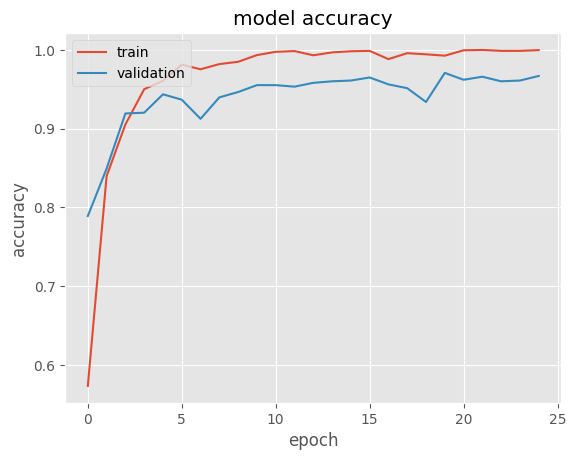

In [52]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [53]:
y_test[:10]

array([5, 0, 1, 2, 5, 1, 1, 0, 1, 5])

In [54]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[np.int64(5),
 np.int64(0),
 np.int64(1),
 np.int64(2),
 np.int64(5),
 np.int64(1),
 np.int64(1),
 np.int64(0),
 np.int64(1),
 np.int64(5)]

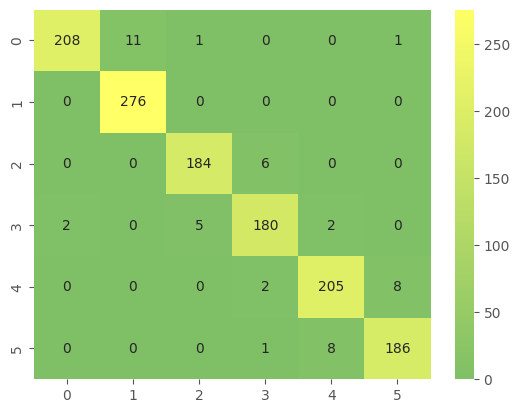

In [55]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [56]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.99      0.94      0.97       221
           1       0.96      1.00      0.98       276
           2       0.97      0.97      0.97       190
           3       0.95      0.95      0.95       189
           4       0.95      0.95      0.95       215
           5       0.95      0.95      0.95       195

    accuracy                           0.96      1286
   macro avg       0.96      0.96      0.96      1286
weighted avg       0.96      0.96      0.96      1286



predected images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


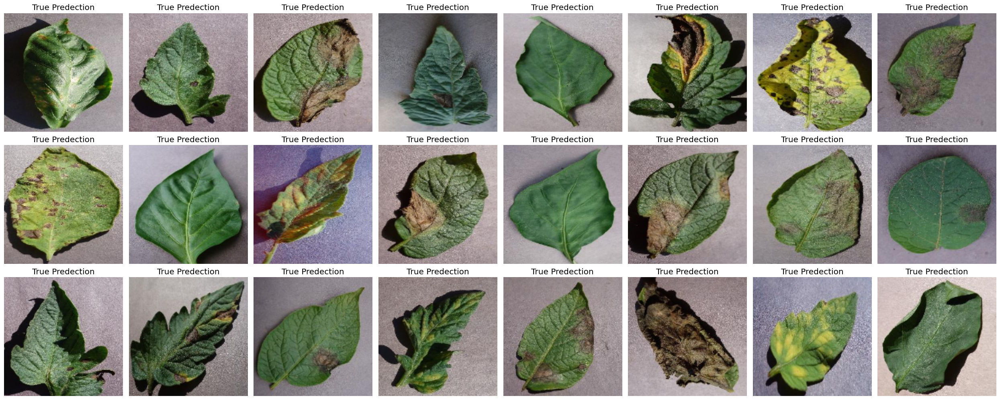

In [57]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)
    pred = np.argmax(Model.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'{isPredectedTrue} Predection')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

In [59]:
Model.save('plant_disease_model.h5')

